In [1]:
%pip install --quiet open3d numpy matplotlib pyrosbag opencv-python bagpy



[notice] A new release of pip is available: 25.1.1 -> 25.3
[notice] To update, run: /usr/local/opt/python@3.11/bin/python3.11 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [9]:
import numpy as np
import plotly.graph_objects as go

#Visualization function
def visualize_point_cloud(pcd, marker_size=2, flip_yz=True):
    """
    Visualize a point cloud using Plotly.
    
    Args:
        pcd: Open3D point cloud object
        marker_size: Size of the markers in the plot
        flip_yz: Whether to flip Y and Z axes for better visualization
    """
    points = np.asarray(pcd.points)
    colors = np.asarray(pcd.colors)
    
    if flip_yz:
        points = points.copy()
        points[:,1] = -points[:,1]
        points[:,2] = -points[:,2]
    
    fig = go.Figure(data=[go.Scatter3d(
        x=points[:,0],
        y=points[:,1],
        z=points[:,2],
        mode='markers',
        marker=dict(size=marker_size, color=colors)
    )])
    
    fig.update_layout(
        scene=dict(xaxis=dict(visible=False),
                   yaxis=dict(visible=False),
                   zaxis=dict(visible=False),
                   aspectmode='data'),
        margin=dict(l=0,r=0,b=0,t=0)
    )
    
    fig.show()
    return 

In [10]:
import open3d as o3d
import numpy as np
import plotly.graph_objects as go
import os

# Task 1.1 : Load Point Cloud
pcd_path = "assets/texturedMesh_alligned_vertex_color.ply"  
pcd = o3d.io.read_point_cloud(pcd_path)
print(pcd)

# Task 1.2 : Downsample Point Cloud
pcd_down = pcd.voxel_down_sample(voxel_size=0.01)

print("Original points:", np.asarray(pcd.points).shape[0])
print("Downsampled points:", np.asarray(pcd_down.points).shape[0])


os.makedirs("outputs", exist_ok=True)
o3d.io.write_point_cloud("outputs/oats_pointcloud_10mm.ply", pcd_down)
print(f"Saved downsampled point cloud to outputs/oats_pointcloud_10mm.ply")

visualize_point_cloud(pcd_down, marker_size=1, flip_yz=True)

PointCloud with 344438 points.
Original points: 344438
Downsampled points: 48541
Saved downsampled point cloud to outputs/oats_pointcloud_10mm.ply


In [11]:
import bagpy
from bagpy import bagreader
import pandas as pd
import numpy as np
import open3d as o3d
import os
import plotly.graph_objects as go
import cv2  

# Task 2.1 : Load Frames from ROS Bag
bag_file = "assets/icp_tracking_oats.bag"
color_topic = "/camera/color/image_raw"
depth_topic = "/camera/aligned_depth_to_color/image_raw"
color_info_topic = "/camera/color/camera_info"
depth_info_topic = "/camera/aligned_depth_to_color/camera_info"

b = bagreader(bag_file)

# Convert topics to DataFrames 
color_csv = b.message_by_topic(color_topic)
depth_csv = b.message_by_topic(depth_topic)
color_info_csv = b.message_by_topic(color_info_topic)

# Load color frames
color_df = pd.read_csv(color_csv)
color_images = []

for i, row in color_df.iterrows():
    if i >= 50: 
        break
    data_bytes = np.frombuffer(eval(row['data']), dtype=np.uint8)  
    height = int(row['height'])
    width = int(row['width'])
    img = data_bytes.reshape(height, width, -1)
    color_images.append(img)

# Load depth frames 
depth_df = pd.read_csv(depth_csv)
depth_images = []

for i, row in depth_df.iterrows():
    if i >= 50: 
        break
    data_bytes = np.frombuffer(eval(row['data']), dtype=np.uint16)
    height = int(row['height'])
    width = int(row['width'])
    depth = data_bytes.reshape(height, width)
    depth_images.append(depth)

print("Loaded color frames:", len(color_images))
print("Loaded depth frames:", len(depth_images))

# Task 2.2: Create Point Cloud from first RGB-D frame 
color_frame = color_images[0]
depth_frame = depth_images[0]

color_o3d = o3d.geometry.Image(color_frame)
depth_o3d = o3d.geometry.Image(depth_frame.astype(np.uint16))

rgbd = o3d.geometry.RGBDImage.create_from_color_and_depth(
    color_o3d,
    depth_o3d,
    depth_scale=1000.0,
    depth_trunc=3.0,
    convert_rgb_to_intensity=False
)

# Load intrinsics from color_info 
color_info_df = pd.read_csv(color_info_csv)
K_row = color_info_df.iloc[0]
color_intrinsics = [
    float(K_row['K_0']),
    float(K_row['K_1']),
    float(K_row['K_2']),
    float(K_row['K_3']),
    float(K_row['K_4']),
    float(K_row['K_5']),
    float(K_row['K_6']),
    float(K_row['K_7']),
    float(K_row['K_8'])
]

intrinsic = o3d.camera.PinholeCameraIntrinsic()
intrinsic.set_intrinsics(
    width=int(K_row['width']),
    height=int(K_row['height']),
    fx=color_intrinsics[0],
    fy=color_intrinsics[4],
    cx=color_intrinsics[2],
    cy=color_intrinsics[5]
)

# Create and save point cloud 
pcd = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd, intrinsic)
os.makedirs("outputs", exist_ok=True)
o3d.io.write_point_cloud("outputs/realsense_pointcloud.ply", pcd)
print("Saved point cloud to outputs/realsense_pointcloud.ply")

visualize_point_cloud(pcd, marker_size=1, flip_yz=True)


[INFO]  Data folder assets/icp_tracking_oats already exists. Not creating.
Loaded color frames: 50
Loaded depth frames: 50
Saved point cloud to outputs/realsense_pointcloud.ply


In [12]:
import open3d as o3d
import numpy as np

# Task 3.1: Pick Correspondences Interactively
def pick_points_interactive(pcd_path, num_points=3, label=""):
    print(f"\n=== Interactive Point Picking ({label}) ===")
    print("Instructions:")
    print("  1. Hold SHIFT + Left Click to select a point")
    print(f"  2. Select exactly {num_points} points")
    print("  3. Press 'Q' to finish")
    print("=" * 45 + "\n")

    # Load point cloud
    pcd = o3d.io.read_point_cloud(pcd_path)
    print(f"Loaded point cloud from: {pcd_path}")
    print(f"Number of points: {len(pcd.points)}")

    # Visualizer
    vis = o3d.visualization.VisualizerWithEditing()
    vis.create_window(
        window_name=f"Pick {num_points} Correspondences ({label})",
        width=1024,
        height=768
    )
    vis.add_geometry(pcd)
    vis.run()
    vis.destroy_window()

    # Retrieve picked indices
    picked_indices = vis.get_picked_points()

    if len(picked_indices) != num_points:
        print(f"✗ Picked {len(picked_indices)} points, expected {num_points}")
        return None, None

    picked_points = np.asarray(pcd.points)[picked_indices]

    print("\nPicked point coordinates:")
    for i, p in enumerate(picked_points):
        print(f"  Point {i+1}: {p}")

    return picked_points, picked_indices


# ---- Pick correspondences ----

model_pcd_path = "outputs/oats_pointcloud_10mm.ply"
realsense_pcd_path = "outputs/realsense_pointcloud.ply"

model_pts, model_idx = pick_points_interactive(
    model_pcd_path, num_points=3, label="Oats model"
)

realsense_pts, realsense_idx = pick_points_interactive(
    realsense_pcd_path, num_points=3, label="REALSENSE"
)

# Checks
if model_pts is not None and realsense_pts is not None:
    print("\n✓ Task 3.1 completed successfully")
    print(f"Model indices: {model_idx}")
    print(f"Realsense indices: {realsense_idx}")
else:
    print("\n✗ Point picking failed — retry")




=== Interactive Point Picking (Oats model) ===
Instructions:
  1. Hold SHIFT + Left Click to select a point
  2. Select exactly 3 points
  3. Press 'Q' to finish

Loaded point cloud from: outputs/oats_pointcloud_10mm.ply
Number of points: 48541
[Open3D INFO] Picked point #38750 (-0.4, 0.25, -0.73) to add in queue.
[Open3D INFO] Picked point #2360 (0.17, 0.26, -0.41) to add in queue.
[Open3D INFO] Picked point #12270 (0.21, -0.093, -0.25) to add in queue.

Picked point coordinates:
  Point 1: [-0.401686    0.250166   -0.72518301]
  Point 2: [ 0.166973    0.2602855  -0.41288799]
  Point 3: [ 0.21073601 -0.092992   -0.25265199]

=== Interactive Point Picking (REALSENSE) ===
Instructions:
  1. Hold SHIFT + Left Click to select a point
  2. Select exactly 3 points
  3. Press 'Q' to finish

Loaded point cloud from: outputs/realsense_pointcloud.ply
Number of points: 209897
[Open3D INFO] Picked point #76374 (-0.053, -0.019, 0.18) to add in queue.
[Open3D INFO] Picked point #156740 (0.097, 0.0

In [13]:
import open3d as o3d
import numpy as np

# Task 3.2: Initial Pose Estimation (Rigid + Scale)
model_pcd = o3d.io.read_point_cloud(model_pcd_path)
realsense_pcd = o3d.io.read_point_cloud(realsense_pcd_path)

assert model_idx is not None and realsense_idx is not None
assert len(model_idx) == len(realsense_idx)

# Build correspondence matrix
correspondences = np.array([
    [model_idx[i], realsense_idx[i]]
    for i in range(len(model_idx))
])
correspondences = o3d.utility.Vector2iVector(correspondences)

# Estimate transformation 
estimator = o3d.pipelines.registration.TransformationEstimationPointToPoint(
    with_scaling=True
)

transformation = estimator.compute_transformation(
    model_pcd,
    realsense_pcd,
    correspondences
)

print("\n=== Initial Transformation (Model → Realsense) ===")
print(transformation)

# Extract scale 
scale = np.cbrt(np.linalg.det(transformation[:3, :3]))
print(f"Estimated scale: {scale:.4f}")

# Task 3.3: Align Model and Visualize
model_pcd_aligned = model_pcd.transform(transformation)

# Color for clarity
model_pcd_aligned.paint_uniform_color([1.0, 0.0, 0.0]) 
realsense_pcd.paint_uniform_color([0.6, 0.6, 0.6])       

# Visualize alignment
o3d.visualization.draw_geometries(
    [model_pcd_aligned, realsense_pcd],
    window_name="Task 3: Initial Alignment"
)



=== Initial Transformation (Model → Realsense) ===
[[ 0.13827848 -0.04740558  0.06041754  0.07097182]
 [ 0.05867929  0.14549821 -0.02013746 -0.03210965]
 [-0.04954098  0.04001859  0.14478504  0.26015396]
 [ 0.          0.          0.          1.        ]]
Estimated scale: 0.1582


In [14]:
# Task 4.1: ICP Tracking Loop
import open3d as o3d
import numpy as np

import open3d as o3d
import numpy as np

# Helper function to convert RGB-D frames to point cloud
def rgbd_to_pcd(color_frame, depth_frame, intrinsic, depth_scale=1000.0, depth_trunc=3.0):
    color_o3d = o3d.geometry.Image(color_frame)
    depth_o3d = o3d.geometry.Image(depth_frame.astype(np.uint16))
    rgbd = o3d.geometry.RGBDImage.create_from_color_and_depth(
        color_o3d,
        depth_o3d,
        depth_scale=depth_scale,
        depth_trunc=depth_trunc,
        convert_rgb_to_intensity=False
    )
    return o3d.geometry.PointCloud.create_from_rgbd_image(rgbd, intrinsic)

# Parameters
voxel_size = 0.01
max_corr_dist = 0.05
current_transform = np.identity(4)  

rmse_list = []
fitness_list = []

# ICP Tracking Loop 
for t in range(len(color_images)):
    print(f"Processing frame {t+1}/{len(color_images)}")

    target_pcd = rgbd_to_pcd(color_images[t], depth_images[t], intrinsic)
    target_pcd = target_pcd.voxel_down_sample(voxel_size)

    icp_result = o3d.pipelines.registration.registration_icp(
        model_pcd,
        target_pcd,
        max_corr_dist,
        current_transform,
        o3d.pipelines.registration.TransformationEstimationPointToPoint()
    )

    current_transform = icp_result.transformation
    rmse_list.append(icp_result.inlier_rmse)
    fitness_list.append(icp_result.fitness)

    print(f"  RMSE: {icp_result.inlier_rmse:.4f}, Fitness: {icp_result.fitness:.4f}")

Processing frame 1/50
  RMSE: 0.0258, Fitness: 0.7946
Processing frame 2/50
  RMSE: 0.0256, Fitness: 0.7889
Processing frame 3/50
  RMSE: 0.0255, Fitness: 0.7921
Processing frame 4/50
  RMSE: 0.0254, Fitness: 0.7942
Processing frame 5/50
  RMSE: 0.0255, Fitness: 0.7919
Processing frame 6/50
  RMSE: 0.0257, Fitness: 0.7842
Processing frame 7/50
  RMSE: 0.0258, Fitness: 0.7848
Processing frame 8/50
  RMSE: 0.0256, Fitness: 0.7888
Processing frame 9/50
  RMSE: 0.0256, Fitness: 0.7892
Processing frame 10/50
  RMSE: 0.0258, Fitness: 0.7857
Processing frame 11/50
  RMSE: 0.0257, Fitness: 0.7888
Processing frame 12/50
  RMSE: 0.0254, Fitness: 0.7908
Processing frame 13/50
  RMSE: 0.0255, Fitness: 0.7971
Processing frame 14/50
  RMSE: 0.0257, Fitness: 0.7881
Processing frame 15/50
  RMSE: 0.0257, Fitness: 0.7907
Processing frame 16/50
  RMSE: 0.0255, Fitness: 0.7879
Processing frame 17/50
  RMSE: 0.0256, Fitness: 0.7915
Processing frame 18/50
  RMSE: 0.0258, Fitness: 0.7918
Processing frame 19

In [15]:
# Task 4.2: Visualize Tracking Results
import open3d as o3d
import numpy as np
import copy
import time

# Parameters 
voxel_size = 0.01
max_corr_dist = 0.05
current_transform = np.identity(4)  

# Open3D visualizer 
vis = o3d.visualization.Visualizer()
vis.create_window(window_name="ICP Tracking", width=1024, height=768)
model_copy = copy.deepcopy(model_pcd)
target_copy = None
vis.add_geometry(model_copy)

for t in range(len(color_images)):
    target_pcd = rgbd_to_pcd(color_images[t], depth_images[t], intrinsic)
    target_pcd = target_pcd.voxel_down_sample(voxel_size)

    if t == 0:
        target_copy = copy.deepcopy(target_pcd)
        vis.add_geometry(target_copy)
    else:
        target_copy.points = target_pcd.points
        target_copy.colors = target_pcd.colors
        target_copy.paint_uniform_color([0.7,0.7,0.7])

    # ICP alignment
    icp_result = o3d.pipelines.registration.registration_icp(
        model_pcd,
        target_pcd,
        max_corr_dist,
        current_transform,
        o3d.pipelines.registration.TransformationEstimationPointToPoint()
    )
    current_transform = icp_result.transformation
    model_copy.transform(current_transform)

    # Update visualizer
    vis.update_geometry(model_copy)
    vis.update_geometry(target_copy)
    vis.poll_events()
    vis.update_renderer()

    # Slow down for visualization
    time.sleep(0.1)

vis.destroy_window()
print("Finished live ICP visualization!")

Finished live ICP visualization!


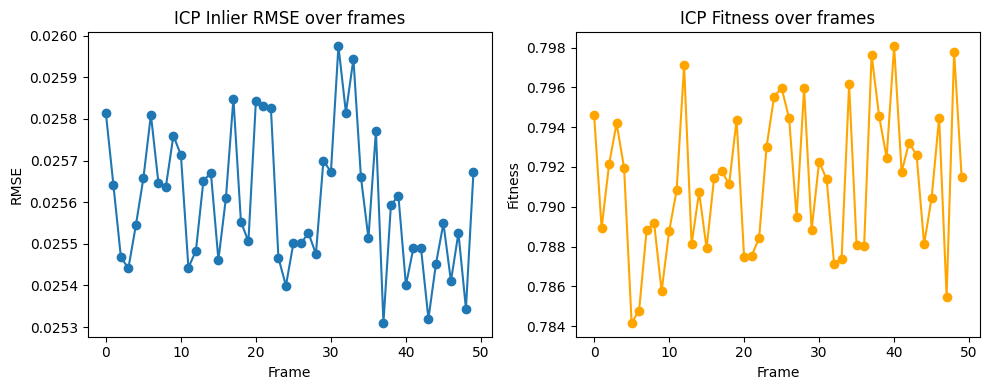

In [16]:
#Task 4.3: Plot ICP Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.plot(rmse_list, '-o')
plt.title('ICP Inlier RMSE over frames')
plt.xlabel('Frame')
plt.ylabel('RMSE')

plt.subplot(1,2,2)
plt.plot(fitness_list, '-o', color='orange')
plt.title('ICP Fitness over frames')
plt.xlabel('Frame')
plt.ylabel('Fitness')

plt.tight_layout()
plt.show()